In [5]:
import imageio.v3 as iio
import os
import numpy as np
import matplotlib.pyplot as plt

In [6]:
import pandas as pd
from PIL import Image
image_paths = "./dataset/the_wildfire_dataset_2n_version"
df_images = pd.DataFrame()
separation = sorted(os.listdir(image_paths))
lables = {
    "nofire": False,
    "fire": True 
}
for sep in separation:
    for label in os.listdir(f"{image_paths}/{sep}"):
        for image in os.listdir(f"{image_paths}/{sep}/{label}"):
            if not image.endswith(".jpg"):
                continue
            #os.makedirs(f"./archive_res/the_wildfire_dataset_2n_version/{sep}/{label}", exist_ok=True)
            
            #img = Image.open(f"{image_paths}/{sep}/{label}/{image}")
            #out = img.resize((224,224))
            #out.save(f"./archive_res/the_wildfire_dataset_2n_version/{sep}/{label}/{image}")
            
            new_row = pd.DataFrame([{
                "path": image,
                "type": sep,
                "label": lables[label]
            }])
            df_images = pd.concat([df_images, new_row]).reset_index(drop=True)

df_images.to_csv("images.csv", index=False)


In [7]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.io import decode_image
from torch.utils.data import Dataset

In [8]:
image_paths = "./dataset/the_wildfire_dataset_2n_version"

class WildFireDataset(Dataset):
    def __init__(self, img_dirs, annotations_file, phase="train", transform=None, target_transform=None):
        self.img_dirs = img_dirs
        self.img_labels = pd.read_csv(annotations_file)
        self.img_labels = self.img_labels[self.img_labels["type"] == phase]
        self.transform = transform
        self.target_transform = target_transform
        self.labels = ["nofire", "fire"]

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        label = 1 if self.img_labels.iloc[idx, 2] else 0
        typ = self.img_labels.iloc[idx, 1]
        img_path = self.img_labels.iloc[idx, 0]
        image = decode_image(os.path.join(f"{self.img_dirs}/{typ}/{self.labels[label]}",img_path), mode="RGB")
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label

In [9]:
transform = transforms.Compose(
    [transforms.ToPILImage(),
      transforms.ToTensor(),
      transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

In [10]:
train_dataset = WildFireDataset(image_paths, "images.csv", phase="train", transform=transform)
val_dataset = WildFireDataset(image_paths, "images.csv", phase="val", transform=transform)
test_dataset = WildFireDataset(image_paths, "images.csv", phase="test", transform=transform)

In [11]:
print("Train size:", len(train_dataset))
print("Validation size:", len(val_dataset))
print("Test size:", len(test_dataset))

total_size = len(train_dataset) + len(val_dataset) + len(test_dataset)

print("Total dataset size", total_size)
print(f"Train percantage: {round(len(train_dataset) * 100 / total_size)}%")
print(f"Validation percantage: {round(len(val_dataset) * 100 / total_size)}%")
print(f"Test percantage: {round(len(test_dataset) * 100 / total_size)}%")

Train size: 1878
Validation size: 398
Test size: 405
Total dataset size 2681
Train percantage: 70%
Validation percantage: 15%
Test percantage: 15%


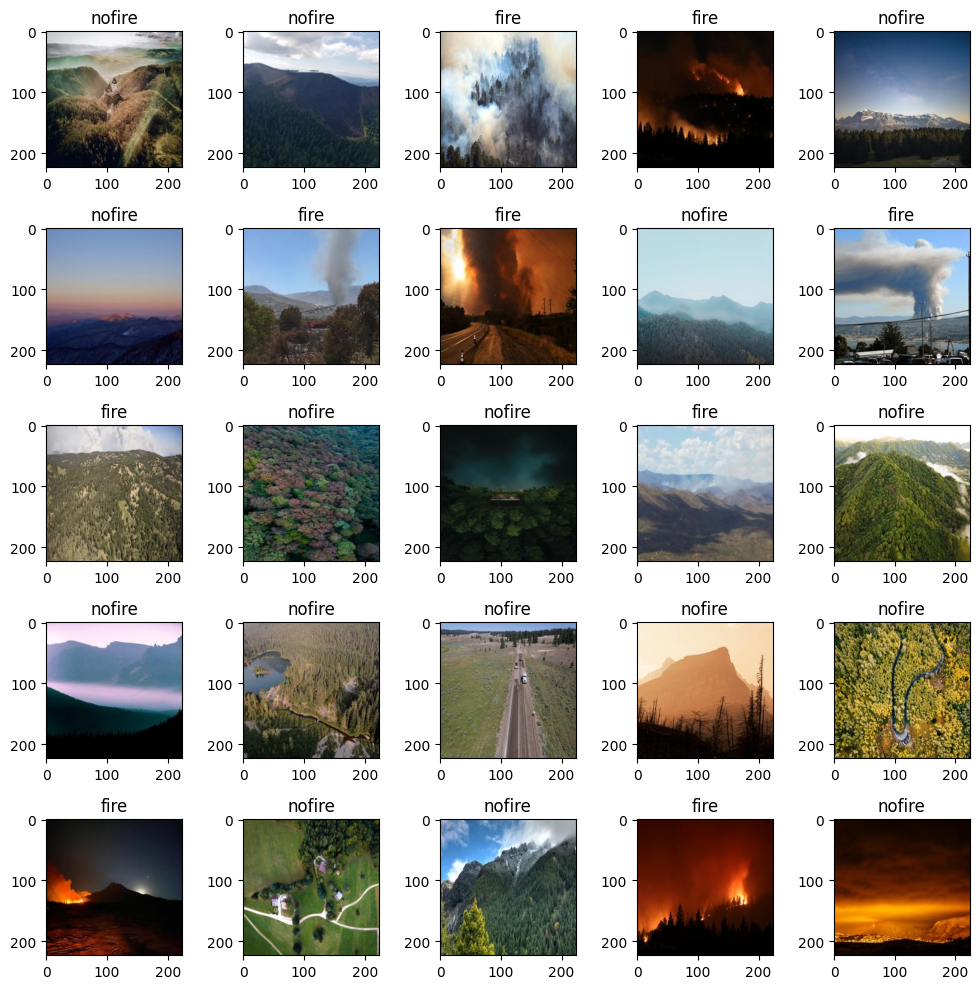

In [12]:
from random import randint
n = 5

fig, ax = plt.subplots(n, n, figsize=(10, 10))

for i in range(n*n):
  i_random = randint(0, len(train_dataset))
  img = train_dataset[i_random][0] / 2 + 0.5
  npimg = img.numpy()
  ax[i // n, i % n].imshow(np.transpose(npimg, (1, 2, 0)))
  ax[i // n, i % n].set_title(train_dataset.labels[train_dataset[i_random][1]])

fig.tight_layout()
plt.show()

In [13]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [14]:
import torchvision.models as models

model = models.mobilenet_v3_small(weights=models.MobileNet_V3_Small_Weights.DEFAULT).to(device)
# Freeze all pre-trained layers

for param in model.parameters():
    param.requires_grad = False

in_features = model.classifier[-1].in_features
model.classifier[-1] = torch.nn.Linear(in_features, 1)
model.classifier.append(torch.nn.Sigmoid())

model.classifier[0].requires_grad = True
model.classifier[-1].requires_grad = True
model.classifier[-2].requires_grad = True

In [15]:
print(model)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): SqueezeExcitation(
          (avgpool): AdaptiveAvgPool2d(output_size=1)
          (fc1): Conv2d(16, 8, kernel_size=(1, 1), stride=(1, 1))
          (fc2): Conv2d(8, 16, kernel_size=(1, 1), stride=(1, 1))
          (activation): ReLU()
          (scale_activation): Hardsigmoid()
        )
        (2): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), 

In [16]:
from torch.utils.data import DataLoader

dataloaders = {
    "train": DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2),
    "val": DataLoader(val_dataset, batch_size=32, shuffle=True, num_workers=2),
}

In [17]:
import time
from tempfile import TemporaryDirectory

dataset_sizes = {
    "train": len(train_dataset),
    "val": len(val_dataset)
}

def choose_label(outputs):
    return (outputs > 0.5).detach().numpy().reshape(-1).astype(int)

def train_model(model, criterion, choose_label, device, optimizer, num_epochs=25):
    since = time.time()

    best_acc = 0.0
    accuracys = {
        "train": [],
        "val": []
    }

    with TemporaryDirectory() as tempdir: 
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')

        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0  
        for epoch in range(num_epochs):
            print(f'Epoch {epoch + 1}/{num_epochs}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0
                loss = None
                preds = []

                # Iterate over data.
                for inputs, labels in dataloaders[phase]:
                    inputs, labels = inputs.to(device), labels.to(device)
                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        preds = choose_label(outputs)
                        loss = criterion(outputs, labels.unsqueeze(1).float())

                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]
                accuracys[phase].append(epoch_acc)

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

                # deep copy the model
                if phase == 'val' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    torch.save(model.state_dict(), best_model_params_path)

            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        print(f'Best val Acc: {best_acc:4f}')

        model.load_state_dict(torch.load(best_model_params_path, weights_only=True))

    return model, accuracys


In [18]:
criterion = torch.nn.BCELoss()
optimizer_ft = torch.optim.Adam(model.parameters(), lr=0.001)

In [19]:
model, accuracys = train_model(model, criterion, choose_label, device, optimizer_ft, num_epochs=50)

Epoch 1/50
----------


train Loss: 0.5302 Acc: 0.7625
val Loss: 0.4934 Acc: 0.7864

Epoch 2/50
----------
train Loss: 0.3932 Acc: 0.8440
val Loss: 0.4222 Acc: 0.8141

Epoch 3/50
----------
train Loss: 0.3582 Acc: 0.8557
val Loss: 0.3816 Acc: 0.8367

Epoch 4/50
----------
train Loss: 0.3294 Acc: 0.8632
val Loss: 0.3590 Acc: 0.8442

Epoch 5/50
----------
train Loss: 0.3099 Acc: 0.8770
val Loss: 0.3464 Acc: 0.8593

Epoch 6/50
----------
train Loss: 0.2946 Acc: 0.8807
val Loss: 0.3391 Acc: 0.8518

Epoch 7/50
----------
train Loss: 0.2800 Acc: 0.8866
val Loss: 0.3299 Acc: 0.8643

Epoch 8/50
----------
train Loss: 0.2779 Acc: 0.8887
val Loss: 0.3233 Acc: 0.8693

Epoch 9/50
----------
train Loss: 0.2603 Acc: 0.9015
val Loss: 0.3185 Acc: 0.8744

Epoch 10/50
----------
train Loss: 0.2596 Acc: 0.9010
val Loss: 0.3157 Acc: 0.8719

Epoch 11/50
----------
train Loss: 0.2588 Acc: 0.8972
val Loss: 0.3162 Acc: 0.8719

Epoch 12/50
----------
train Loss: 0.2595 Acc: 0.8956
val Loss: 0.3146 Acc: 0.8693

Epoch 13/50
----------


Melhor acurácia: 89%

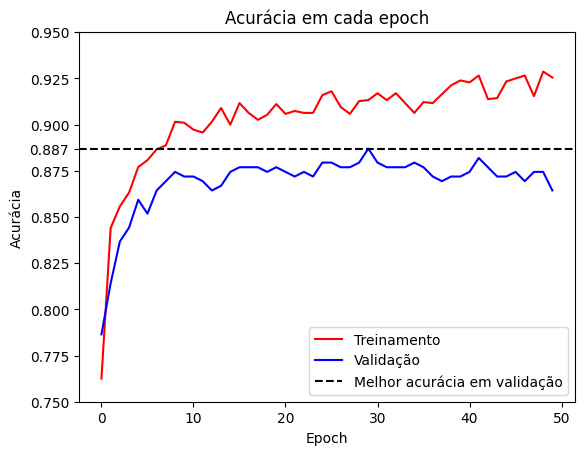

In [20]:
best = max(accuracys["val"])

plt.title("Acurácia em cada epoch")
plt.plot(accuracys["train"], c='r', label="Treinamento")
plt.plot(accuracys["val"], c='b', label="Validação")
plt.axhline(y=best, label='Melhor acurácia em validação', ls='--', c="black")

yticks = list(plt.yticks())[0].tolist() + [best]
plt.yticks(yticks)

plt.xlabel("Epoch")
plt.ylabel("Acurácia")
plt.legend()
plt.show()

## Testando

In [21]:
true_labels = [test_dataset[j][1] for j in range(len(test_dataset))]
print(f'GroundTruth: {[test_dataset.labels[true_labels[j]] for j in range(len(test_dataset))]}')

GroundTruth: ['nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofir

In [22]:
images = torch.Tensor([test_dataset[j][0].tolist() for j in range(len(test_dataset))])
outputs = model(images)
preds = choose_label(outputs)
predicted_labels = [test_dataset.labels[preds[j]] for j in range(len(test_dataset))]
print(f'Predicted: {predicted_labels}')
print(f"Accuracy: {np.sum(true_labels == preds)/len(test_dataset)}")

Predicted: ['nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'fire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'fire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'fire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'fire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'fire', 'nofire', 'nofire', 'nofire', 'nofire', 'fire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'fire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'nofire', 'fire', 'fire', 'nofire', 'nofire', 'nofire', 'fire', 'nofire'

## Redução de Dimensionalidade para Enteder o Modelo

In [23]:
from torchvision.models.feature_extraction import create_feature_extractor
from torchvision.models.feature_extraction import get_graph_node_names

return_nodes = {
    'flatten': 'layer',
}

model2 = create_feature_extractor(model, return_nodes=return_nodes)

images = torch.Tensor([test_dataset[j][0].tolist() for j in range(len(test_dataset))])
mem = []
for img in images:
    feats = model2(torch.Tensor([img.tolist()]))
    mem.append(feats["layer"][0].tolist())

/home/lelio/USP/sem7/pdi/pdi_env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


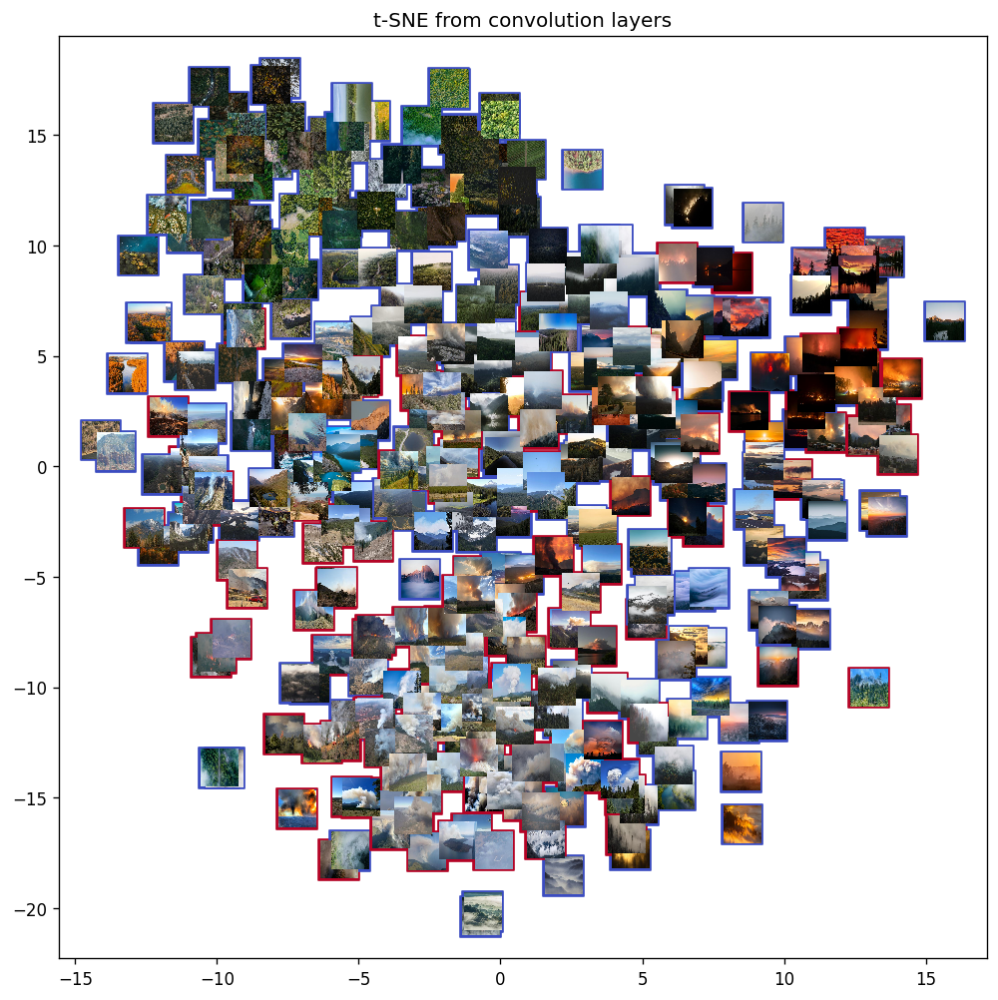

In [24]:
from sklearn.manifold import TSNE
from umap import UMAP
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(img):
    return OffsetImage(np.transpose(img  / 2 + 0.5, (1, 2, 0)), zoom=.1, alpha=1)

reducer = TSNE(n_components=2, random_state=42)
X_red = reducer.fit_transform(np.array(mem))

fig, ax = plt.subplots(figsize=(10, 10), dpi=120)
ax.scatter(x=X_red[:, 0], y=X_red[:, 1], c=preds, marker="s", s=600, cmap="coolwarm")

for image, point in zip(images, X_red):
    ab = AnnotationBbox(getImage(image), (point[0], point[1]), frameon=False)
    ax.add_artist(ab)

plt.title("t-SNE from convolution layers")
plt.show()

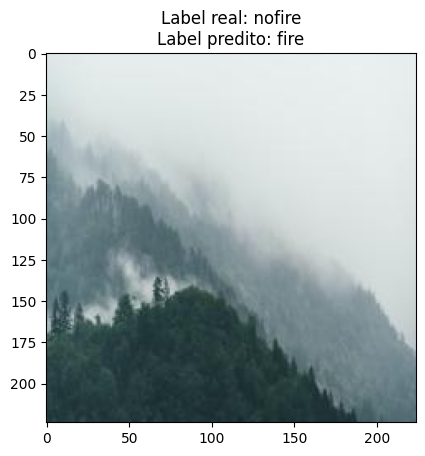

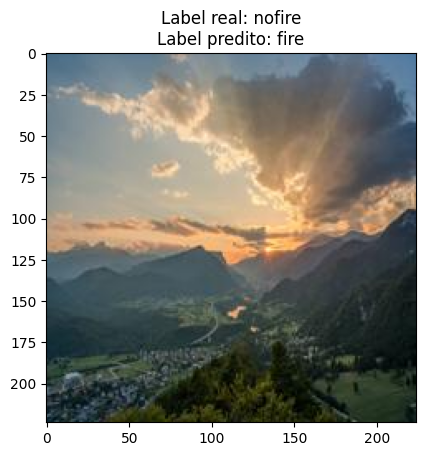

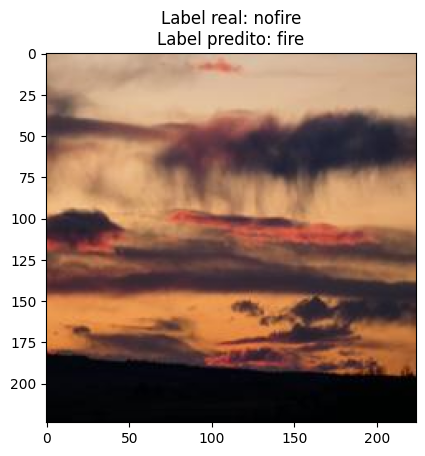

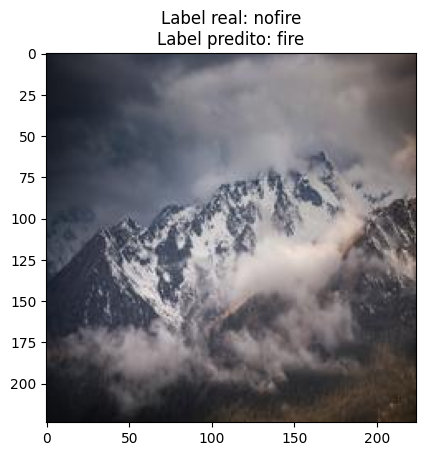

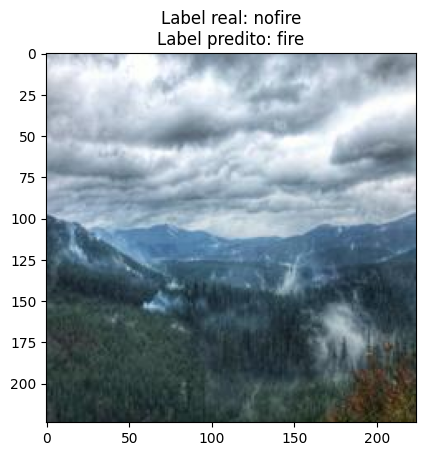

...

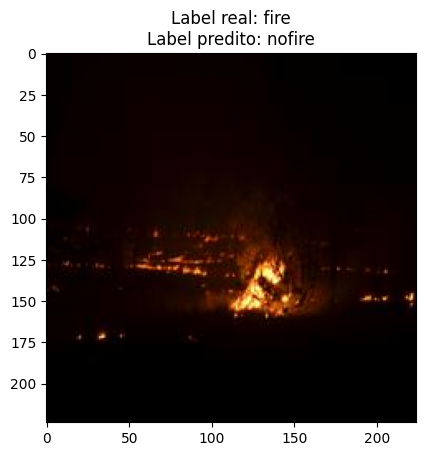

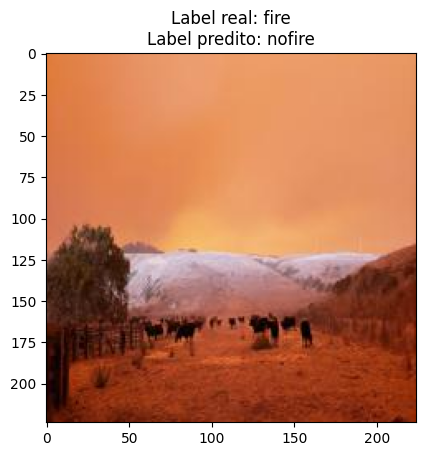

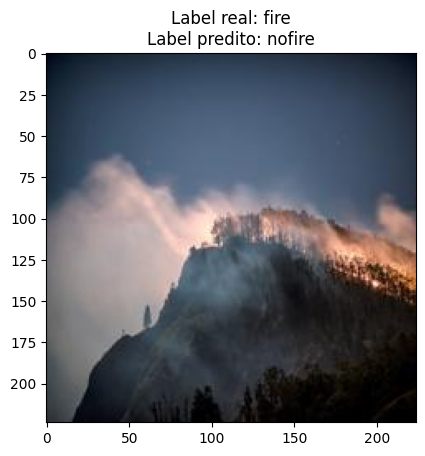

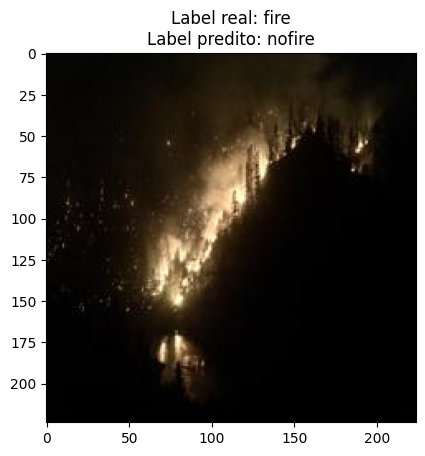

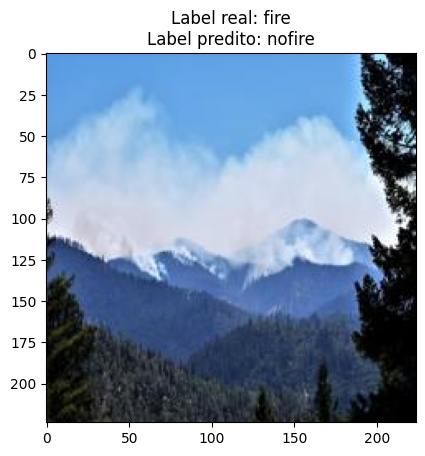

In [25]:
for i in range(len(true_labels)):
    if true_labels[i] != preds[i]:
        img = images[i] / 2 + 0.5
        npimg = img.numpy()
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
        plt.title(f"Label real: {test_dataset.labels[true_labels[i]]}\nLabel predito: {test_dataset.labels[preds[i]]}")
        plt.show()